# Preparing Graphics for Tree Canopy Analysis
In this supplementary notebook, I prepare the Heat Health Census Tracts data to create a `folium` overlay map and `plotly` chart. In doing so, I merge this data with ACS data on transit use in LA County. 

In [2]:
# pandas as pd
import pandas as pd

# geopandas for shapefiles as gpd
import geopandas as gpd

# folium for mapping
import folium 

# plotly for interactive plots
import plotly.express as px

# matplot as plt and contextily as ctx 

import matplotlib.pyplot as plt

import contextily as ctx

In [3]:
#importing census health data as csv 
chs = pd.read_csv('Data/heat health census.csv')

In [4]:
#resolving issues with geoid column (FIPS)
chs['GEOID'] = chs['GEOID'].astype(str)
chs.GEOID.head()

0    6037101110
1    6037101122
2    6037101210
3    6037101220
4    6037101300
Name: GEOID, dtype: object

In [5]:
# adding the leading zero back to the geoid/fips column
chs['GEOID'] = chs['GEOID'].str.zfill(11)

In [6]:
# maintaining only LAC and deleting all other counties from df
counties_to_keep = ['Los Angeles County']

# Use boolean indexing to filter the DataFrame
chsf = chs[chs['County'].isin(counties_to_keep)]

In [7]:
# reviewing changes to df
chsf.head()

,OBJECTID,GEOID,NAME,State,County,Low_Summer_Mean_LST_F,High_Summer_Mean_LST_F,Summer_Mean_LST_F,MEAN_PCT_TreeCanopy,MEAN_PCT_LackingCanopy,...,B15002_calc_pctLTHSE_Z_SCORE,B01001_calc_pctGE65E_Z_SCORE,PCT_Pop_Minority_Z_SCORE,PCT_Young_People_Z_SCORE,B17020_calc_pctPovE_Z_SCORE,B18101_calc_pctDE_Z_SCORE,PCT_HH_Lives_Alone_Z_SCORE,B16004_calc_pctGE18LEAE_Z_SCORE,SHAPE_Length,SHAPE_Area
0,9621,06037101110,Census Tract 1011.10,California,Los Angeles County,112.445785,114.308945,113.377365,4.568379,95.431621,...,-0.411291,0.517458,-1.356986,0.281542,-0.128678,-0.018055,0.391801,-0.278053,0.047170,0.000112
1,9622,06037101122,Census Tract 1011.22,California,Los Angeles County,108.972107,110.393158,109.682632,5.722298,94.277702,...,-0.965534,0.974830,-2.290443,-1.495972,-1.070000,0.138051,0.030532,-0.954398,0.096237,0.000259
2,9623,06037101210,Census Tract 1012.10,California,Los Angeles County,113.156311,113.156311,113.156311,1.617607,98.382393,...,-0.356476,-0.580236,-0.796911,0.298545,1.057387,1.609909,0.345681,0.904026,0.037365,0.000064
3,9624,06037101220,Census Tract 1012.20,California,Los Angeles County,113.156300,113.156300,113.156300,4.756757,95.243243,...,-0.125034,0.380246,-0.872382,-0.904273,0.059586,1.297697,0.268816,0.440943,0.038499,0.000068
4,9625,06037101300,Census Tract 1013,California,Los Angeles County,106.193161,110.677368,109.197107,5.534333,94.465667,...,-0.715820,1.615151,-2.127585,-1.495683,-0.891149,1.587608,-0.177006,-0.418197,0.085846,0.000253


In [8]:
#importing geojson with tract location data
tracts=gpd.read_file('Data/Census_Tracts_20202.geojson')
tracts.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [9]:
#creating a geoid or fips column in the geojson df
tracts = tracts[['CT20','geometry']]
tracts['GEOID'] ='06' + '037' + tracts['CT20']
tracts.head()

,CT20,geometry,GEOID
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122
2,101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222


In [10]:
#merging census health df and geojson on geoid
chsftract =tracts.merge(chsf,on="GEOID")
chsftract.head()

,CT20,geometry,GEOID,OBJECTID,NAME,State,County,Low_Summer_Mean_LST_F,High_Summer_Mean_LST_F,Summer_Mean_LST_F,...,B15002_calc_pctLTHSE_Z_SCORE,B01001_calc_pctGE65E_Z_SCORE,PCT_Pop_Minority_Z_SCORE,PCT_Young_People_Z_SCORE,B17020_calc_pctPovE_Z_SCORE,B18101_calc_pctDE_Z_SCORE,PCT_HH_Lives_Alone_Z_SCORE,B16004_calc_pctGE18LEAE_Z_SCORE,SHAPE_Length,SHAPE_Area
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,9621,Census Tract 1011.10,California,Los Angeles County,112.445785,114.308945,113.377365,...,-0.411291,0.517458,-1.356986,0.281542,-0.128678,-0.018055,0.391801,-0.278053,0.047170,0.000112
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,9622,Census Tract 1011.22,California,Los Angeles County,108.972107,110.393158,109.682632,...,-0.965534,0.974830,-2.290443,-1.495972,-1.070000,0.138051,0.030532,-0.954398,0.096237,0.000259
2,101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,9624,Census Tract 1012.20,California,Los Angeles County,113.156300,113.156300,113.156300,...,-0.125034,0.380246,-0.872382,-0.904273,0.059586,1.297697,0.268816,0.440943,0.038499,0.000068
3,101300,"POLYGON ((-118.26530 34.25735, -118.26530 34.2...",06037101300,9625,Census Tract 1013,California,Los Angeles County,106.193161,110.677368,109.197107,...,-0.715820,1.615151,-2.127585,-1.495683,-0.891149,1.587608,-0.177006,-0.418197,0.085846,0.000253
4,101400,"POLYGON ((-118.29657 34.25356, -118.29694 34.2...",06037101400,9626,Census Tract 1014,California,Los Angeles County,107.282639,113.693161,109.485264,...,-0.788907,0.837618,-1.539705,-0.855504,-0.702885,1.141591,0.145830,-0.473035,0.133831,0.000618


In [11]:
# moving the geometry column for mapping purposes
non_geometry_columns = [col for col in chsftract.columns if col != chsftract.geometry.name]

# reordering to put geometry column on the right
new_column_order = non_geometry_columns + [chsftract.geometry.name]

# creating new df with the reordered columns
chsft = chsftract[new_column_order]


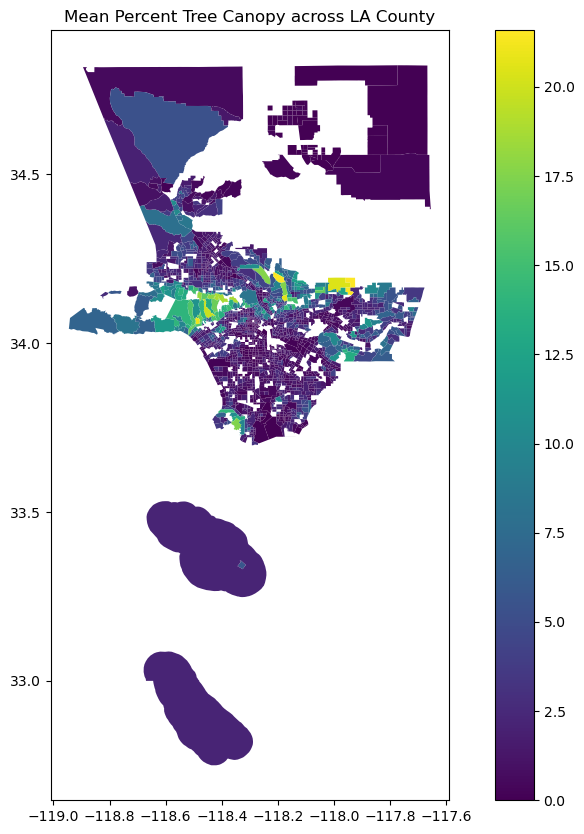

In [12]:
# creating a static plot to review changes 
fig, ax = plt.subplots(figsize=(12, 10))
chsft.plot(ax=ax, column='MEAN_PCT_TreeCanopy', legend=True, cmap='viridis')

ax.set_title('Mean Percent Tree Canopy across LA County')
plt.show()

In [13]:
# importing neighborhoods geojson
neighborhoods = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

In [14]:
# creating an appropriate geodataframe to join
chsft = gpd.GeoDataFrame(
   chsft,geometry = 'geometry', crs=4326)

In [15]:
# spatial join to merge census health df and neighborhood names 
chsfta = gpd.sjoin(neighborhoods, chsft) 
chsfta

,OBJECTID_left,name,geometry,index_right,CT20,GEOID,OBJECTID_right,NAME,State,County,...,B15002_calc_pctLTHSE_Z_SCORE,B01001_calc_pctGE65E_Z_SCORE,PCT_Pop_Minority_Z_SCORE,PCT_Young_People_Z_SCORE,B17020_calc_pctPovE_Z_SCORE,B18101_calc_pctDE_Z_SCORE,PCT_HH_Lives_Alone_Z_SCORE,B16004_calc_pctGE18LEAE_Z_SCORE,SHAPE_Length,SHAPE_Area
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,...,0.435300,-0.366795,0.605262,-0.381695,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046
31,32,Exposition Park,"POLYGON ((-118.29155 34.01837, -118.28294 34.0...",618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,...,0.435300,-0.366795,0.605262,-0.381695,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046
51,52,Jefferson Park,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,...,0.435300,-0.366795,0.605262,-0.381695,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,...,1.227076,-0.397287,0.942896,-0.622134,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037
51,52,Jefferson Park,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,...,1.227076,-0.397287,0.942896,-0.622134,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",273,137000,06037137000,9923,Census Tract 1370,California,Los Angeles County,...,-1.020349,1.142533,-1.909116,-0.131308,-0.815843,0.517166,-0.361484,-1.076261,0.101572,0.000294
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",275,137104,06037137104,9925,Census Tract 1371.04,California,Los Angeles County,...,-0.868085,1.523676,-1.666814,-0.674933,-0.091025,0.227254,-0.376857,-0.674111,0.072998,0.000251
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",274,137103,06037137103,9924,Census Tract 1371.03,California,Los Angeles County,...,-0.807179,0.669915,-1.440401,-0.059814,-0.909975,-0.218763,0.476353,-0.942211,0.035176,0.000074
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",276,137301,06037137301,9927,Census Tract 1373.01,California,Los Angeles County,...,-1.014259,0.685161,-1.865422,-1.441993,-1.135893,0.294157,-0.592081,-1.271244,0.063838,0.000157


In [16]:
# moving the geometry column for mapping again
non_geometry_columns = [col for col in chsfta.columns if col != chsfta.geometry.name]

# reordering to put geometry column on the right
new_column_order = non_geometry_columns + [chsfta.geometry.name]

# creating new df with the reordered columns
chsfta = chsfta[new_column_order]
chsfta

,OBJECTID_left,name,index_right,CT20,GEOID,OBJECTID_right,NAME,State,County,Low_Summer_Mean_LST_F,...,B01001_calc_pctGE65E_Z_SCORE,PCT_Pop_Minority_Z_SCORE,PCT_Young_People_Z_SCORE,B17020_calc_pctPovE_Z_SCORE,B18101_calc_pctDE_Z_SCORE,PCT_HH_Lives_Alone_Z_SCORE,B16004_calc_pctGE18LEAE_Z_SCORE,SHAPE_Length,SHAPE_Area,geometry
0,1,Adams-Normandie,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.366795,0.605262,-0.381695,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
31,32,Exposition Park,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.366795,0.605262,-0.381695,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,"POLYGON ((-118.29155 34.01837, -118.28294 34.0..."
51,52,Jefferson Park,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.366795,0.605262,-0.381695,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,"POLYGON ((-118.31335 34.03721, -118.30900 34.0..."
0,1,Adams-Normandie,611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,112.508900,...,-0.397287,0.942896,-0.622134,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
51,52,Jefferson Park,611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,112.508900,...,-0.397287,0.942896,-0.622134,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037,"POLYGON ((-118.31335 34.03721, -118.30900 34.0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,113,Woodland Hills,273,137000,06037137000,9923,Census Tract 1370,California,Los Angeles County,113.029999,...,1.142533,-1.909116,-0.131308,-0.815843,0.517166,-0.361484,-1.076261,0.101572,0.000294,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."
112,113,Woodland Hills,275,137104,06037137104,9925,Census Tract 1371.04,California,Los Angeles County,116.787895,...,1.523676,-1.666814,-0.674933,-0.091025,0.227254,-0.376857,-0.674111,0.072998,0.000251,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."
112,113,Woodland Hills,274,137103,06037137103,9924,Census Tract 1371.03,California,Los Angeles County,116.456314,...,0.669915,-1.440401,-0.059814,-0.909975,-0.218763,0.476353,-0.942211,0.035176,0.000074,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."
112,113,Woodland Hills,276,137301,06037137301,9927,Census Tract 1373.01,California,Los Angeles County,116.456314,...,0.685161,-1.865422,-1.441993,-1.135893,0.294157,-0.592081,-1.271244,0.063838,0.000157,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."


In [17]:
# importing 2022 ACS datasets
ACS_22 = pd.read_csv('Data/ACS_22C.csv')

In [18]:
# converting GEO_ID to a string for 22
ACS_22C = pd.read_csv(
    'Data/ACS_22C.csv',
    dtype=
    {
        'GEO_ID':str
    }
)

In [19]:
# reducing the dataframe for ACS 22
columns_to_keep = ['GEO_ID',
                   'B08301_010E',
                   'B08301_001E'
                  ]
ACS_22Cb = ACS_22C[columns_to_keep]

# Reviewing the reduced dataframe
ACS_22Cb.head()

,GEO_ID,B08301_010E,B08301_001E
0,06037101110,49,2043
1,06037101122,9,2014
2,06037101220,91,1665
3,06037101221,47,1762
4,06037101222,19,1105


In [20]:
# adding percentage transit for 2022
ACS_22Cb['transit_pct'] = (ACS_22Cb['B08301_010E'] / ACS_22Cb['B08301_001E']) * 100
# Verifying results of this column addition
ACS_22Cb.sample(5)

/tmp/ipykernel_161/854486539.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ACS_22Cb['transit_pct'] = (ACS_22Cb['B08301_010E'] / ACS_22Cb['B08301_001E']) * 100


,GEO_ID,B08301_010E,B08301_001E,transit_pct
931,06037264304,62,1757,3.528742
154,06037119802,41,1454,2.819807
865,06037238320,151,1267,11.917916
850,06037237201,121,1421,8.515130
319,06037134905,30,3983,0.753201


In [21]:
# changing column names ACS 22
ACS_22Cb.columns = ['GEOID',
'Total Transit Users (excluding taxicabs)',                 
'Total Commuters', 
'Percent Transit Users'
                  ]
# Reviewing column label changes 
ACS_22Cb.head()

,GEOID,Total Transit Users (excluding taxicabs),Total Commuters,Percent Transit Users
0,06037101110,49,2043,2.398434
1,06037101122,9,2014,0.446872
2,06037101220,91,1665,5.465465
3,06037101221,47,1762,2.667423
4,06037101222,19,1105,1.719457


In [22]:
# merging at FIPS
chsftab=chsfta.merge(ACS_22Cb,on="GEOID")
chsftab.head()

,OBJECTID_left,name,index_right,CT20,GEOID,OBJECTID_right,NAME,State,County,Low_Summer_Mean_LST_F,...,B17020_calc_pctPovE_Z_SCORE,B18101_calc_pctDE_Z_SCORE,PCT_HH_Lives_Alone_Z_SCORE,B16004_calc_pctGE18LEAE_Z_SCORE,SHAPE_Length,SHAPE_Area,geometry,Total Transit Users (excluding taxicabs),Total Commuters,Percent Transit Users
0,1,Adams-Normandie,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",130,1647,7.893139
1,32,Exposition Park,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,"POLYGON ((-118.29155 34.01837, -118.28294 34.0...",130,1647,7.893139
2,52,Jefferson Park,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",130,1647,7.893139
3,1,Adams-Normandie,611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,112.508900,...,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",90,1608,5.597015
4,52,Jefferson Park,611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,112.508900,...,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",90,1608,5.597015


In [23]:
# moving the geometry column for mapping a third time  
non_geometry_columns = [col for col in chsftab.columns if col != chsftab.geometry.name]

# reordering to put geometry column on the right
new_column_order = non_geometry_columns + [chsftab.geometry.name]

# creating new df with the reordered columns
chsftabc = chsftab[new_column_order]
chsftabc

,OBJECTID_left,name,index_right,CT20,GEOID,OBJECTID_right,NAME,State,County,Low_Summer_Mean_LST_F,...,B17020_calc_pctPovE_Z_SCORE,B18101_calc_pctDE_Z_SCORE,PCT_HH_Lives_Alone_Z_SCORE,B16004_calc_pctGE18LEAE_Z_SCORE,SHAPE_Length,SHAPE_Area,Total Transit Users (excluding taxicabs),Total Commuters,Percent Transit Users,geometry
0,1,Adams-Normandie,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,130,1647,7.893139,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,32,Exposition Park,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,130,1647,7.893139,"POLYGON ((-118.29155 34.01837, -118.28294 34.0..."
2,52,Jefferson Park,618,222001,06037222001,10306,Census Tract 2220.01,California,Los Angeles County,112.130005,...,-0.175744,-0.107259,-0.376857,-0.034326,0.028075,0.000046,130,1647,7.893139,"POLYGON ((-118.31335 34.03721, -118.30900 34.0..."
3,1,Adams-Normandie,611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,112.508900,...,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037,90,1608,5.597015,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
4,52,Jefferson Park,611,221500,06037221500,10299,Census Tract 2215,California,Los Angeles County,112.508900,...,1.518635,0.896281,0.184263,0.587180,0.025951,0.000037,90,1608,5.597015,"POLYGON ((-118.31335 34.03721, -118.30900 34.0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1855,113,Woodland Hills,273,137000,06037137000,9923,Census Tract 1370,California,Los Angeles County,113.029999,...,-0.815843,0.517166,-0.361484,-1.076261,0.101572,0.000294,15,2112,0.710227,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."
1856,113,Woodland Hills,275,137104,06037137104,9925,Census Tract 1371.04,California,Los Angeles County,116.787895,...,-0.091025,0.227254,-0.376857,-0.674111,0.072998,0.000251,0,1091,0.000000,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."
1857,113,Woodland Hills,274,137103,06037137103,9924,Census Tract 1371.03,California,Los Angeles County,116.456314,...,-0.909975,-0.218763,0.476353,-0.942211,0.035176,0.000074,137,2780,4.928058,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."
1858,113,Woodland Hills,276,137301,06037137301,9927,Census Tract 1373.01,California,Los Angeles County,116.456314,...,-1.135893,0.294157,-0.592081,-1.271244,0.063838,0.000157,9,1106,0.813743,"POLYGON ((-118.57240 34.18668, -118.57161 34.1..."


In [24]:
# creating a popup tool using branca for pct tree canopy
import branca.colormap as cm

colormap = cm.LinearColormap(
    ["#effff1","#bde7c4","#6bd688","#31bd3f","#089c2f"],
    vmin=chsft["MEAN_PCT_TreeCanopy"].quantile(0.0),
    vmax=chsft["MEAN_PCT_TreeCanopy"].quantile(1),
    caption="Mean Percent Tree Canopy",
)
gdf_json = chsftab.to_json()

In [25]:
# creating the folium map we will overlay with our colormap on tree canopy
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')
# creating GeoJson popups 
popup = folium.GeoJsonPopup(
    fields=["name", "MEAN_PCT_TreeCanopy","Percent Transit Users"],
    aliases=["Neighborhood", "Mean Percent Tree Canopy", "Percent Transit Users"],
    localize=True,
    labels=True,
    style="background-color: black;",
)
#creating the tooltip
tooltip = folium.GeoJsonTooltip(
    fields=["name", "MEAN_PCT_TreeCanopy", "Percent Transit Users"],
    aliases=["Neighborhood:", "Mean Percent Tree Canopy:", "Percent Transit Users:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)
#creating the choropleth graduated color map 
g = folium.GeoJson(
    chsftab,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["MEAN_PCT_TreeCanopy"])
        if x["properties"]["MEAN_PCT_TreeCanopy"] is not None
        else "transparent",
        "color": "green",
        "weight": .5,
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(m)
#adding the color map
colormap.add_to(m)

m

In [26]:
# saving as an html
m.save("pctcanopya.html")

In [27]:
# descriptive stats for chart - westlake data 
chsftabcw = chsftab[chsftab['name'].isin(['Westlake'])]
chsftabcw[['Percent Transit Users']].mean()

Percent Transit Users    28.238731
dtype: float64

In [28]:
# descriptive stats for chart - westlake data 
chsftabcw[['MEAN_PCT_TreeCanopy']].mean()

MEAN_PCT_TreeCanopy    1.076688
dtype: float64

In [29]:
# descriptive stats for chart - echo park data 
chsftabce = chsftab[chsftab['name'].isin(['Echo Park'])]
chsftabce[['Percent Transit Users']].mean()

Percent Transit Users    10.41579
dtype: float64

In [30]:
# descriptive stats for chart - echo park data 
chsftabce[['MEAN_PCT_TreeCanopy']].mean()

MEAN_PCT_TreeCanopy    5.020549
dtype: float64

In [31]:
# descriptive stats for chart - silver lake data 
chsftabcs = chsftab[chsftab['name'].isin(['Silver Lake'])]
chsftabcs[['Percent Transit Users']].mean()

Percent Transit Users    7.876387
dtype: float64

In [32]:
# descriptive stats for chart - silver lake data 
chsftabcs[['MEAN_PCT_TreeCanopy']].mean()

MEAN_PCT_TreeCanopy    4.930103
dtype: float64

In [33]:
# creating a new df for use with plotly 
d = {'Neighborhood': ['Westlake', 'Echo Park', 'Silver Lake'], 'Percent Transit Users': [28.238731, 10.41579, 7.876387], 'Percent Tree Canopy': [1.076688,5.020549,4.930103]}
df = pd.DataFrame(data=d)
df

,Neighborhood,Percent Transit Users,Percent Tree Canopy
0,Westlake,28.238731,1.076688
1,Echo Park,10.415790,5.020549
2,Silver Lake,7.876387,4.930103


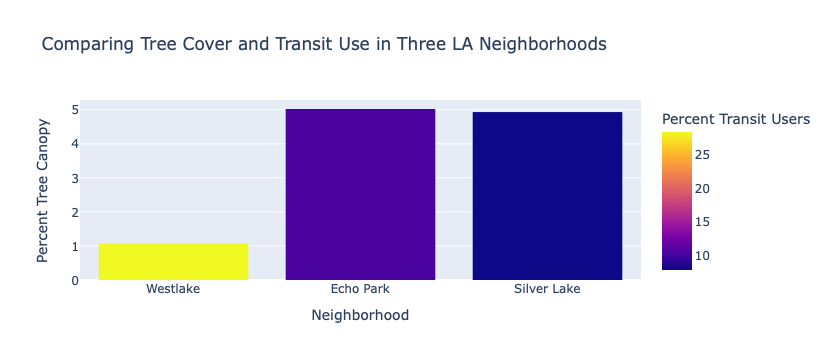

In [37]:
# subsetting for neighborhood and plotting with plotly

chsftabc = chsftab[chsftab['name'].isin(['Westlake', 'Echo Park', 'Silver Lake'])]
fig = px.bar(df,
       x= 'Neighborhood',
       y= 'Percent Tree Canopy', 
        color='Percent Transit Users',
       title='Comparing Tree Cover and Transit Use in Three LA Neighborhoods'
)
fig.update_traces(marker_line_width=0)
fig.show()